<a href="https://colab.research.google.com/github/thetrotfreak/MCA572/blob/cv/2347111_CV_Lab4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load the Satellite Image:

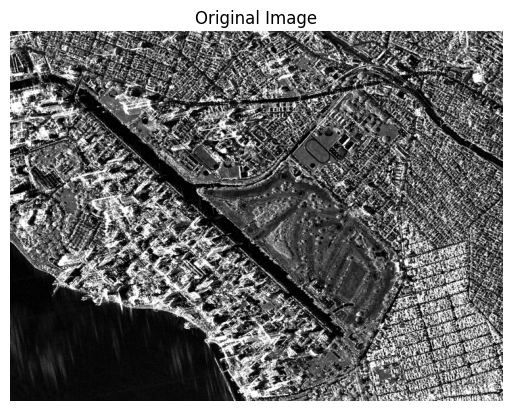

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/medium_radar-constellation-hawaii-multiacqui (1).png', 0)  # Load in grayscale
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

# Decompose the Image Using Fourier Transform:

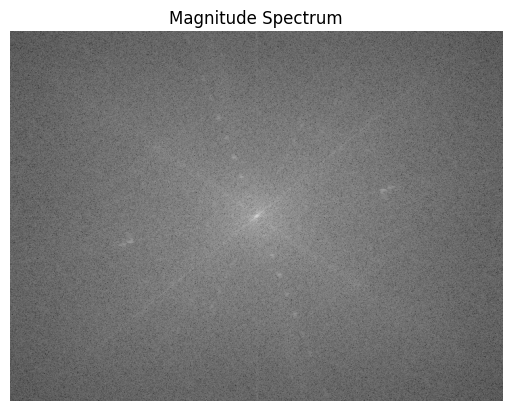

In [ ]:
# Apply Fourier Transform
dft = np.fft.fft2(image)

# Shift the zero frequency component to the center
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(np.abs(dft_shift))

# Display the magnitude spectrum
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')
plt.show()


# Apply Filters in the Frequency Domain:

## Ideal Low Pass Filter (ILPF):

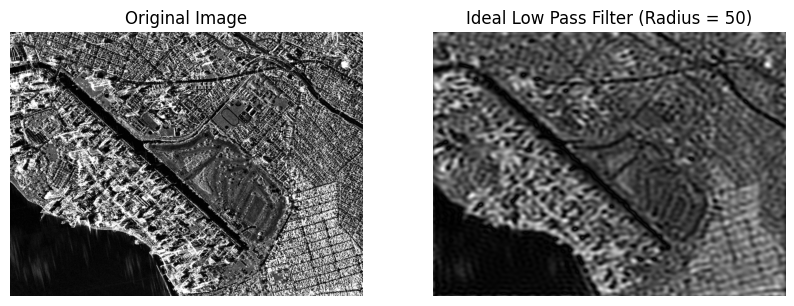

In [ ]:
def ideal_low_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.zeros((rows, cols), np.uint8)
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i - center[0])**2 + (j - center[1])**2) <= radius:
                mask[i, j] = 1
    return mask

radius = 50
ilpf_mask = ideal_low_pass_filter(image.shape, radius)

# Apply mask in frequency domain
filtered_dft = dft_shift * ilpf_mask
filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
filtered_image = np.abs(filtered_image)

# Plot the original and filtered images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title(f'Ideal Low Pass Filter (Radius = {radius})')
plt.axis('off')

# Display both images
plt.show()

## Ideal High Pass Filter (IHPF):

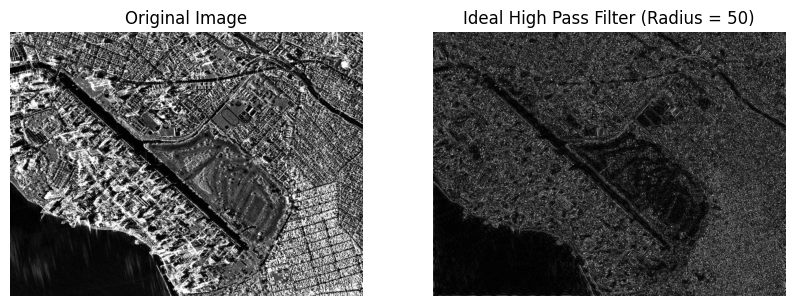

In [ ]:
def ideal_high_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.ones((rows, cols), np.uint8)
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i - center[0])**2 + (j - center[1])**2) <= radius:
                mask[i, j] = 0
    return mask

radius = 50
ihpf_mask = ideal_high_pass_filter(image.shape, radius)

# Apply mask in frequency domain
filtered_dft = dft_shift * ihpf_mask
filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
filtered_image = np.abs(filtered_image)

# Plot the original and filtered images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title(f'Ideal High Pass Filter (Radius = {radius})')
plt.axis('off')

# Display both images
plt.show()

## Butterworth Low Pass Filter (BLPF):

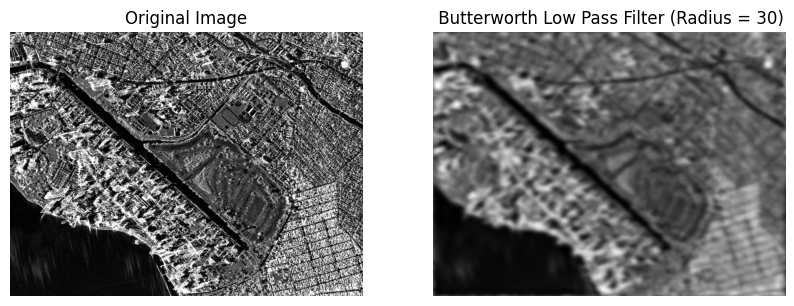

In [ ]:
def butterworth_low_pass_filter(shape, radius, order=2):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = 1 / (1 + (d / radius)**(2 * order))
    return mask

radius = 30
blpf_mask = butterworth_low_pass_filter(image.shape, radius)

# Apply mask in frequency domain
filtered_dft = dft_shift * blpf_mask
filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
filtered_image = np.abs(filtered_image)

# Plot the original and filtered images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title(f' Butterworth Low Pass Filter (Radius = {radius})')
plt.axis('off')

# Display both images
plt.show()


## Butterworth High Pass Filter (BHPF):

<ipython-input-24-076d694f0eff>:8: RuntimeWarning: divide by zero encountered in scalar divide
  mask[i, j] = 1 / (1 + (radius / d)**(2 * order))


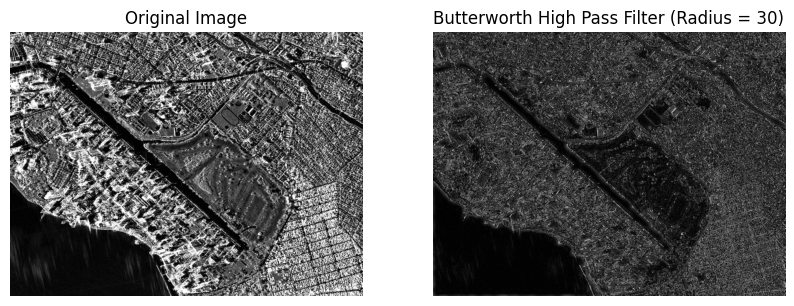

In [ ]:
def butterworth_high_pass_filter(shape, radius, order=2):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.ones((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = 1 / (1 + (radius / d)**(2 * order))
    return mask

radius = 30
bhpf_mask = butterworth_high_pass_filter(image.shape, radius)

# Apply mask in frequency domain
filtered_dft = dft_shift * bhpf_mask
filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
filtered_image = np.abs(filtered_image)

# Plot the original and filtered images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Show the filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title(f'Butterworth High Pass Filter (Radius = {radius})')
plt.axis('off')
plt.show()


## Gaussian Low Pass Filter (GLPF):

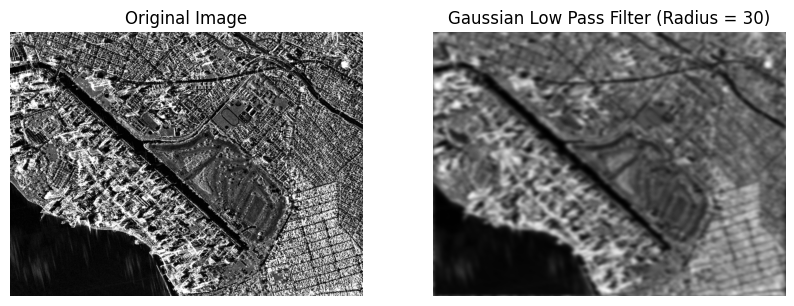

In [ ]:
def gaussian_low_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = np.exp(-(d**2) / (2 * (radius**2)))
    return mask

radius = 30
glpf_mask = gaussian_low_pass_filter(image.shape, radius)

# Apply mask in frequency domain
filtered_dft = dft_shift * glpf_mask
filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
filtered_image = np.abs(filtered_image)

# Plot the original and filtered images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Show the filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title(f'Gaussian Low Pass Filter (Radius = {radius})')
plt.axis('off')
plt.show()


## Gaussian High Pass Filter (GHPF):

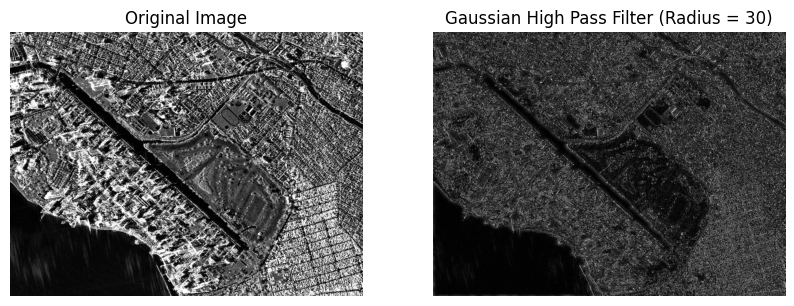

In [ ]:
def gaussian_high_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.ones((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = 1 - np.exp(-(d**2) / (2 * (radius**2)))
    return mask

radius = 30
ghpf_mask = gaussian_high_pass_filter(image.shape, radius)

# Apply mask in frequency domain
filtered_dft = dft_shift * ghpf_mask
filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
filtered_image = np.abs(filtered_image)

# Plot the original and filtered images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Show the filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title(f'Gaussian High Pass Filter (Radius = {radius})')
plt.axis('off')
plt.show()


# Analyze with Visualization Proof:

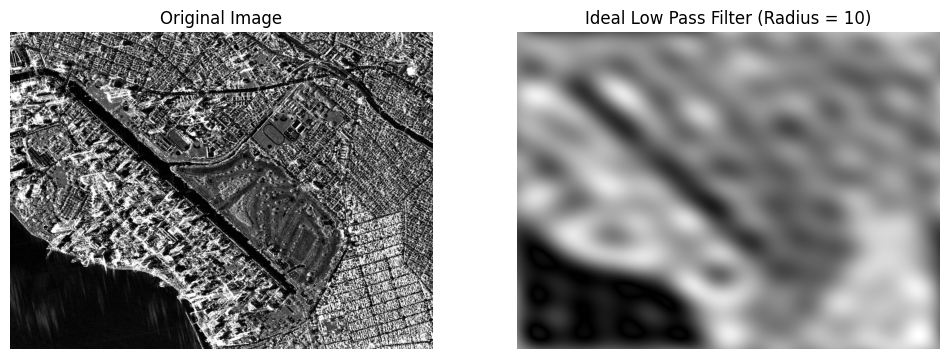

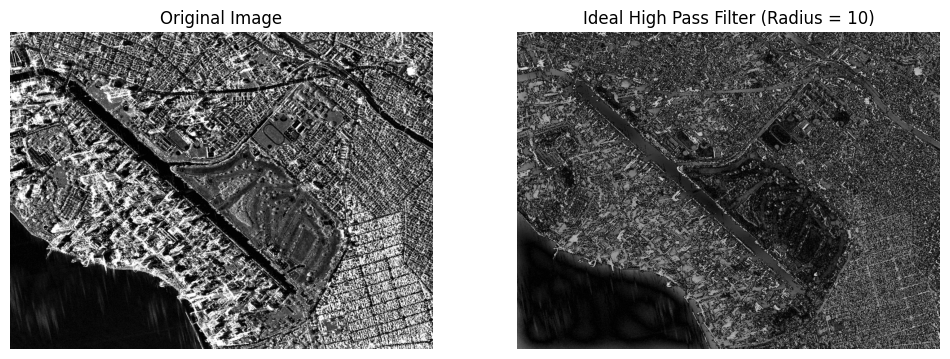

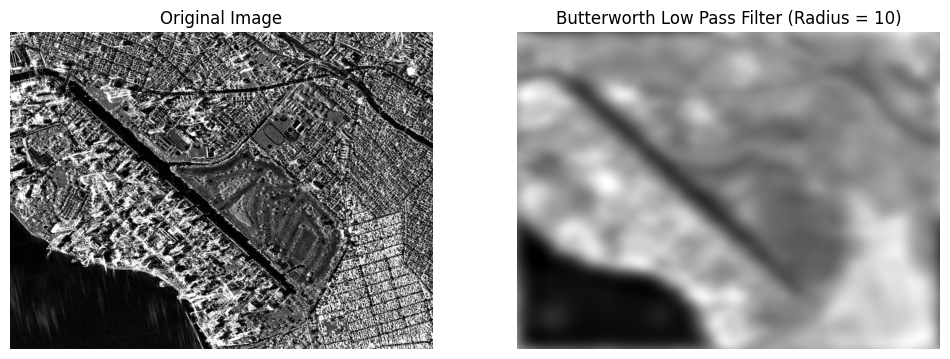

<ipython-input-31-df5cd176185a>:70: RuntimeWarning: divide by zero encountered in scalar divide
  mask[i, j] = 1 / (1 + (radius / d)**(2 * order))


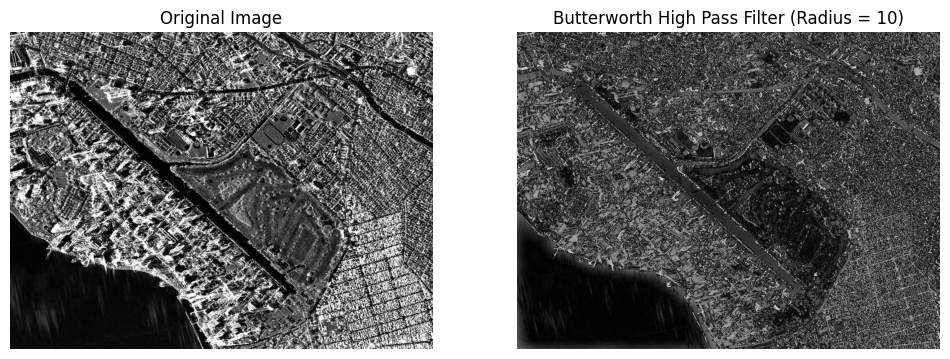

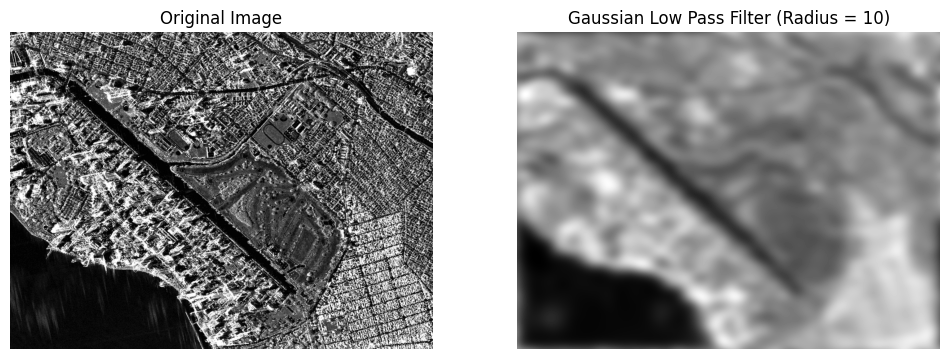

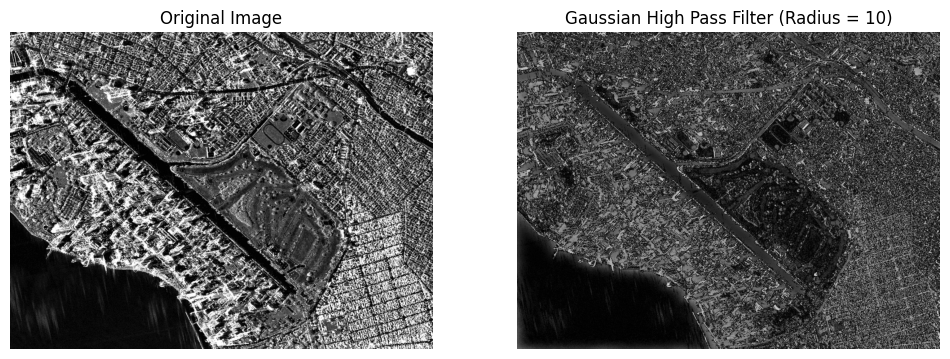

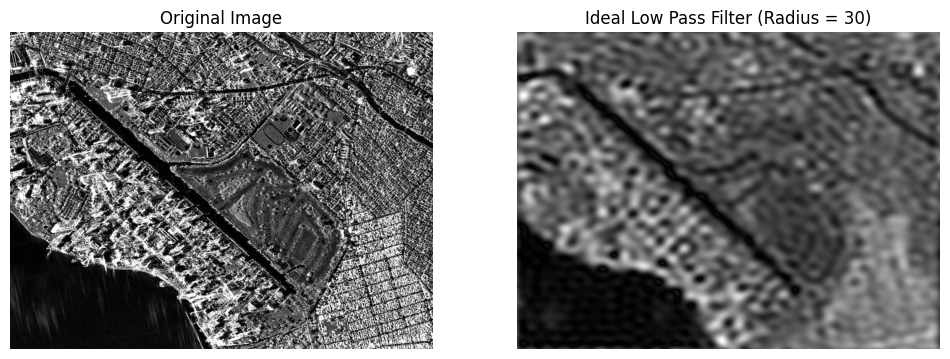

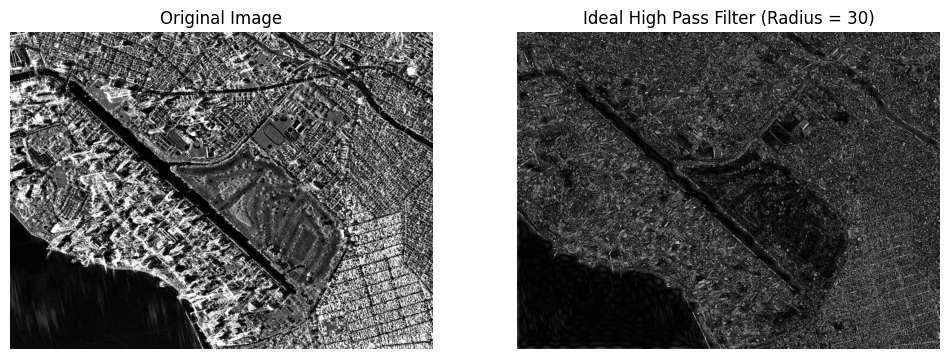

...

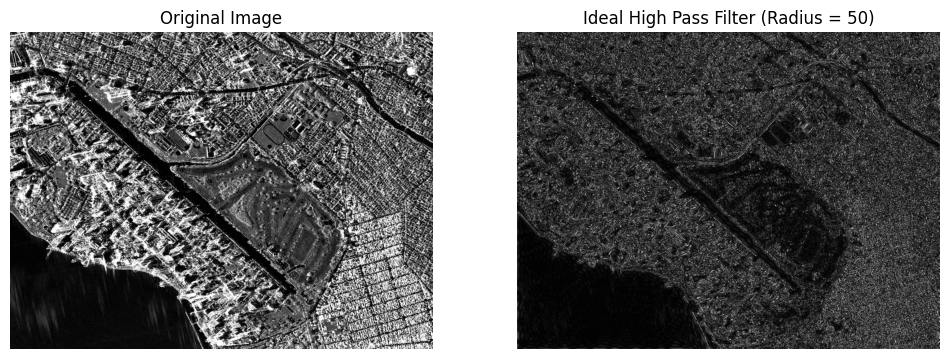

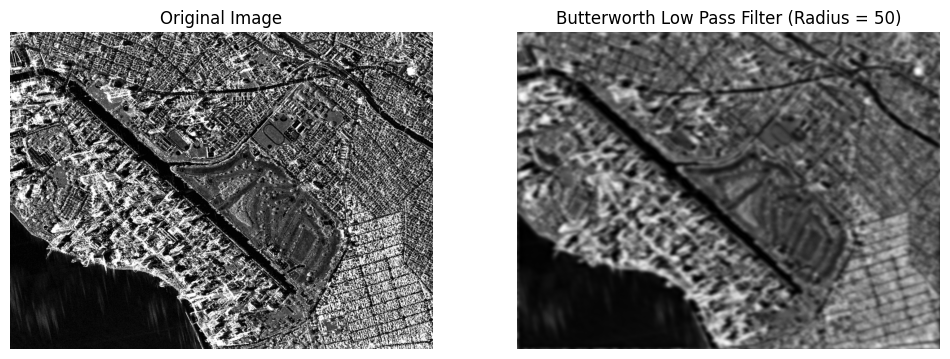

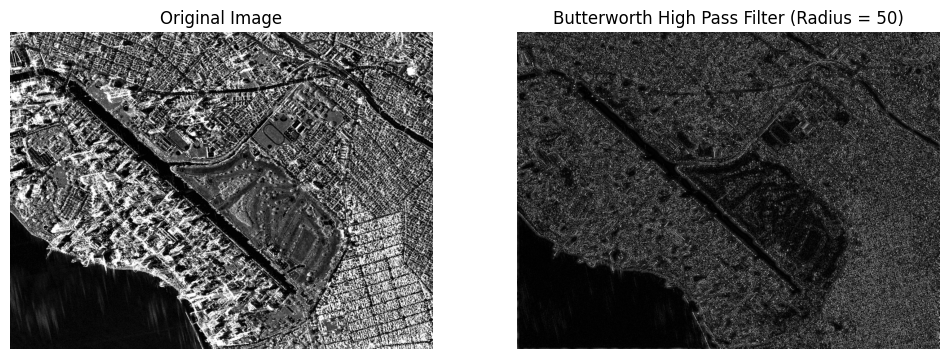

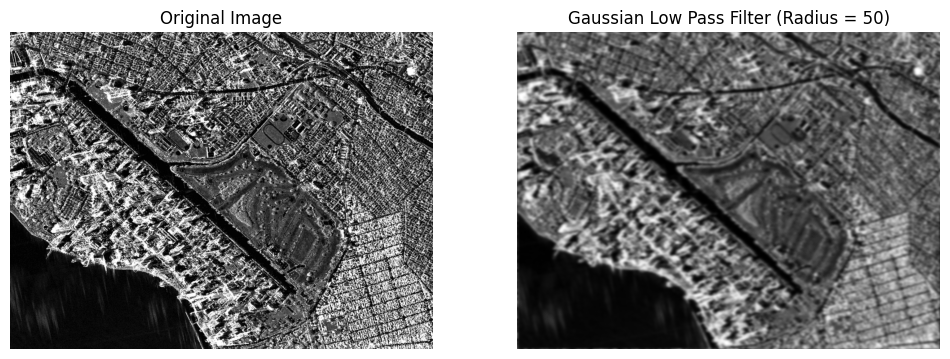

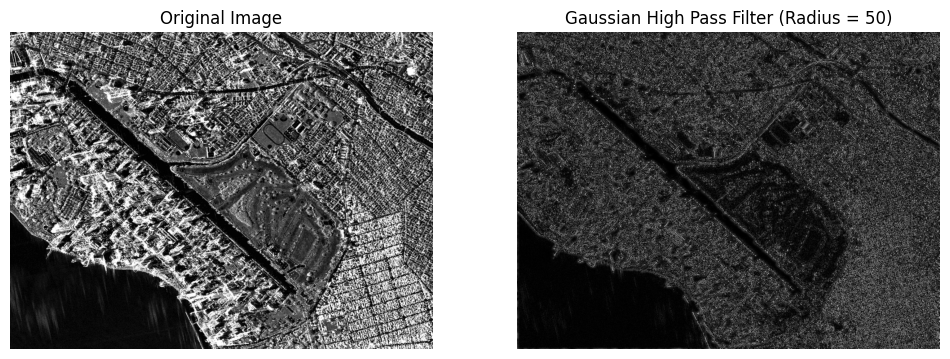

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Fourier Transform of the image
dft = np.fft.fft2(image)
dft_shift = np.fft.fftshift(dft)

# Function to display the results side by side
def plot_results(original_image, filtered_image, filter_name, radius):
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Filtered Image
    plt.subplot(1, 2, 2)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'{filter_name} (Radius = {radius})')
    plt.axis('off')

    # Show both images
    plt.show()

# Function for Ideal Low Pass Filter
def ideal_low_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.zeros((rows, cols), np.uint8)
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i - center[0])**2 + (j - center[1])**2) <= radius:
                mask[i, j] = 1
    return mask

# Function for Ideal High Pass Filter
def ideal_high_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.ones((rows, cols), np.uint8)
    for i in range(rows):
        for j in range(cols):
            if np.sqrt((i - center[0])**2 + (j - center[1])**2) <= radius:
                mask[i, j] = 0
    return mask

# Function for Butterworth Low Pass Filter
def butterworth_low_pass_filter(shape, radius, order=2):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = 1 / (1 + (d / radius)**(2 * order))
    return mask

# Function for Butterworth High Pass Filter
def butterworth_high_pass_filter(shape, radius, order=2):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.ones((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = 1 / (1 + (radius / d)**(2 * order))
    return mask

# Function for Gaussian Low Pass Filter
def gaussian_low_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = np.exp(-(d**2) / (2 * (radius**2)))
    return mask

# Function for Gaussian High Pass Filter
def gaussian_high_pass_filter(shape, radius):
    rows, cols = shape
    center = (int(rows / 2), int(cols / 2))
    mask = np.ones((rows, cols))
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - center[0])**2 + (j - center[1])**2)
            mask[i, j] = 1 - np.exp(-(d**2) / (2 * (radius**2)))
    return mask

# Apply filters and visualize for different radii
radii = [10, 30, 50]

for radius in radii:
    # Ideal Low Pass Filter
    ilpf_mask = ideal_low_pass_filter(image.shape, radius)
    filtered_dft = dft_shift * ilpf_mask
    filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
    filtered_image = np.abs(filtered_image)
    plot_results(image, filtered_image, 'Ideal Low Pass Filter', radius)

    # Ideal High Pass Filter
    ihpf_mask = ideal_high_pass_filter(image.shape, radius)
    filtered_dft = dft_shift * ihpf_mask
    filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
    filtered_image = np.abs(filtered_image)
    plot_results(image, filtered_image, 'Ideal High Pass Filter', radius)

    # Butterworth Low Pass Filter
    blpf_mask = butterworth_low_pass_filter(image.shape, radius)
    filtered_dft = dft_shift * blpf_mask
    filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
    filtered_image = np.abs(filtered_image)
    plot_results(image, filtered_image, 'Butterworth Low Pass Filter', radius)

    # Butterworth High Pass Filter
    bhpf_mask = butterworth_high_pass_filter(image.shape, radius)
    filtered_dft = dft_shift * bhpf_mask
    filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
    filtered_image = np.abs(filtered_image)
    plot_results(image, filtered_image, 'Butterworth High Pass Filter', radius)

    # Gaussian Low Pass Filter
    glpf_mask = gaussian_low_pass_filter(image.shape, radius)
    filtered_dft = dft_shift * glpf_mask
    filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
    filtered_image = np.abs(filtered_image)
    plot_results(image, filtered_image, 'Gaussian Low Pass Filter', radius)

    # Gaussian High Pass Filter
    ghpf_mask = gaussian_high_pass_filter(image.shape, radius)
    filtered_dft = dft_shift * ghpf_mask
    filtered_image = np.fft.ifft2(np.fft.ifftshift(filtered_dft))
    filtered_image = np.abs(filtered_image)
    plot_results(image, filtered_image, 'Gaussian High Pass Filter', radius)


Six filters are implemented:
1. Ideal Low Pass
2. Ideal High Pass
3. Butterworth Low Pass
4. Butterworth High Pass
5. Gaussian Low Pass
6. Gaussian High Pass

**Cutoff Radii:** For each filter, the cutoff radius is varied $(10, 30, 50)$ to analyze how the frequency domain filters affect the image.

**Visualization:** The plot_results function displays the original image and the filtered image side by side for comparison.

**Low Pass Filters:** As the radius increases, more high-frequency details (edges and fine textures) are blurred out, and the image becomes smoother.

**High Pass Filters:** As the radius decreases, low-frequency components are removed, leaving behind sharp edges and fine details.